# Train, evaluate RetinaNet on detect Logos
* Created by:  Dr. James G. Shanahan
* Email: James.Shanahan_AT_gmail.com


This notebook introduces object detection, overviews success approaches to object detection (two-stage and single staget detectors), and in particular describes RetinaNet, a single stage object detector that delivers state-of-the-art results. The notebook also introduces  [a RetinaNet implementation in Keras](https://github.com/fizyr/keras-retinanet). The course Docker container has a preinstalled RetinaNet, so no installation is required. 

In this notebook you will learn by example how to do the following with RetinaNet:

* Set up training, testing datasets that can be used by RetinaNet for training and prediction
* Train a RetinaNet from training data (from an existing checkpoint or from scratch)
* Evaluate a trained RetinaNet model on a test set
* Detect objects using a trained RetinaNet model on a test image or a directory of images

All these are presented using a small sample problem, that of detecting logos in images whis also included in this lab.

Note: this notebook is under construction and is missing lots of references at this time. Some of the code from this notebook   is derived from the excellent [PyImageSearch book](https://www.pyimagesearch.com/) by Adrian Rosebrock and  [the RetinaNet implementation in Keras](https://github.com/fizyr/keras-retinanet).


## Warning
This notebook is based on an earlier verion of Retinanet located [here](https://github.com/fizyr/keras-retinanet) that works with Keras 1.X. To work with Keras 2.X please use tf-retinane[https://github.com/fizyr/tf-retinanet], a tf.keras porting of keras-retinanet.

# Object detection overview
Object detection is a computer technology related to computer vision and image processing that deals with detecting instances of semantic objects of a certain class (such as humans, buildings, or cars) in digital images and videos. Well-researched domains of object detection include face detection and pedestrian detection. Object detection has applications in many areas of computer vision, including image retrieval and video surveillance.

Current state-of-the-art object detectors are based on a two-stage, proposal-driven mechanism. As popularized
in the R-CNN framework `R. Girshick, J. Donahue, T. Darrell, and J. Malik. Rich feature hierarchies for accurate object detection and semantic segmentation. In CVPR, 2014`, the first stage generates a sparse set of candidate object locations and the second stage classifies each candidate location as one of the foreground classes or as background using a convolutional neural network.

Despite the success of two-stage detectors, a natural
question to ask is: could a simple single-stage detector achieve
similar accuracy? Singel stage detectors are applied over a
regular, dense sampling of object locations, scales, and aspect
ratios. Recent work on single-stage detectors, such as
YOLO and  [SSD](https://arxiv.org/pdf/1512.02325.pdf), demonstrates promising
results, yielding faster detectors with accuracy within 10-
40% relative to state-of-the-art two-stage methods.

In this notebook we focus on [RetinaNet](https://arxiv.org/pdf/1708.02002.pdf)  a one-stage
object detector that matches the
state-of-the-art COCO AP of more complex *two-stage detectors*, such as:
* the Feature Pyramid Network FPN ([T.-Y. Lin, P. Dollar, R. Girshick, K. He, B. Hariharan, and ´
S. Belongie. Feature pyramid networks for object detection.
In CVPR, 2017.](https://arxiv.org/abs/1612.03144)
* or Mask R-CNN (K. He, G. Gkioxari, P. Dollar, and R. Girshick. Mask R- ´
CNN. In ICCV, 2017.) variants of Faster R-CNN (S. Ren, K. He, R. Girshick, and J. Sun. Faster R-CNN: Towards
real-time object detection with region proposal networks.
In NIPS, 2015).

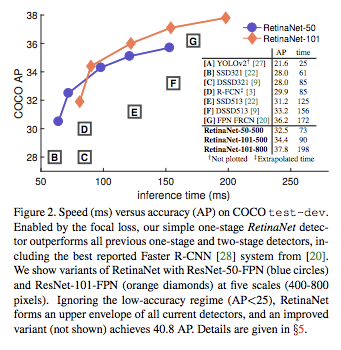

RetinaNet is efficient and accurate; the best model, based on a ResNet-101-FPN backbone, achieves a COCO test-dev AP of 39.1
while running at 5 fps, surpassing the previously best published single-model results from both one and two-stage detectors, see Figure 2 above.


The following Medium post provide a more detailed comparison between the two-stage and single-stage object detectors:

* ["Object detection: speed and accuracy comparison (Faster R-CNN, R-FCN, SSD, FPN, RetinaNet and YOLOv3)"]( : https://medium.com/@jonathan_hui/object-detection-speed-and-accuracy-comparison-faster-r-cnn-r-fcn-ssd-and-yolo-5425656ae359)

There is no straight answer on which object detectors is the best. For real-life applications, we tradeoff accuracy memory footprint, and speed. Besides the detector types, we need to be aware of other choices that impact the performance:

* Feature extractors (VGG16, ResNet, Inception, MobileNet).
* Output strides for the extractor.
* Input image resolutions.
* Matching strategy and IoU threshold (how predictions are excluded in calculating loss).
* Non-max suppression IoU threshold.
* Hard example mining ratio (positive v.s. negative anchor ratio).
* The number of proposals or predictions.
* Boundary box encoding.
* Data augmentation.
* Training dataset.
* Use of multi-scale images in training or testing (with cropping).
* Which feature map layer(s) for object detection.
* Localization loss function.
* Deep learning software platform used.
* Training configurations including batch size, input image resize, learning rate, and learning rate decay.



## RetinaNet
RetinaNet was first introduced by [Lin et al. in their 2017 paper, Focal Loss for Dense Object
Detection](https://arxiv.org/pdf/1708.02002.pdf). RetinaNet can be considered a cousin to both the R-CNN family (Girshick is actually
the third author on the RetinaNet paper) and the SSD family of object detectors.

### Feature Pyramid Networks for Object Detection

Feature Pyramid Network Backbone: We adopt the Feature
Pyramid Network (FPN) from [T.-Y. Lin, P. Dollar, R. Girshick, K. He, B. Hariharan, and ´
S. Belongie. Feature pyramid networks for object detection.
In CVPR, 2017.](https://arxiv.org/abs/1612.03144)

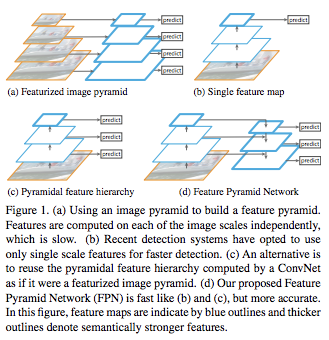

### SSD: Single Shot MultiBox Detector
The Single Shot MultiBox Detector is a single stage object detector framework was described in the [SSD framework](https://arxiv.org/pdf/1512.02325.pdf) paper.  The SSD approach is based on a feed-forward convolutional network that produces a fixed-size collection of bounding boxes and scores for the presence of object class
instances in those boxes, followed by a non-maximum suppression step to produce the
final detections. The early network layers are based on a standard architecture used for
high quality image classification (truncated before any classification layers), which is referred to as  the base/backbone network. Then an  auxiliary structure is added to the network to produce
detections with the following key features:

* **Multi-scale  feature maps for detection**  Convolutional feature layers are added to the end of the truncated base network. These layers decrease in size progressively and allow predictions of detections at multiple scales. 
  *  The convolutional model for predicting detections is different for each feature layer (cf Overfeat and YOLO that operate on a single scale feature map).

* **Convolutional predictors for detection** Each added feature layer (or optionally an existing
feature layer from the base network) can produce a fixed set of detection predictions
using a set of convolutional filters. These are indicated on top of the SSD network
architecture in the Figure below. For a feature layer of size m × n with p channels, the basic element
for predicting parameters of a potential detection is a 3 × 3 × p small kernel
that produces either a score for a category, or a shape offset relative to the default box
coordinates. At each of the m × n locations where the kernel is applied, it produces an
output value. The bounding box offset output values are measured relative to a default box position relative to each feature map location (cf the architecture of YOLO that
uses an intermediate fully connected layer instead of a convolutional filter for this step).
* **Default boxes and aspect ratios**  A set of default bounding boxes are associated with
each feature map cell, for multiple feature maps at the top of the network. The default
boxes tile the feature map in a convolutional manner, so that the position of each box
relative to its corresponding cell is fixed. At each feature map cell, we predict the offsets
relative to the default box shapes in the cell, as well as the per-class scores that indicate
the presence of a class instance in each of those boxes. Specifically, for each box out of
$k$ at a given location, we compute $c$ class scores and the $4$ offsets relative to the original
default box shape. This results in a total of $(c + 4)k$ filters that are applied around each
location in the feature map, yielding $(c + 4)kmn$ outputs for a $m × n$ feature map. For
an illustration of default boxes, please refer to anchor box figures below. The default boxes are similar to
the anchor boxes used in Faster R-CNN, however the SSD paper applies them to several feature
maps of different resolutions. Allowing different default box shapes in several feature
maps let us efficiently discretize the space of possible output box shapes.


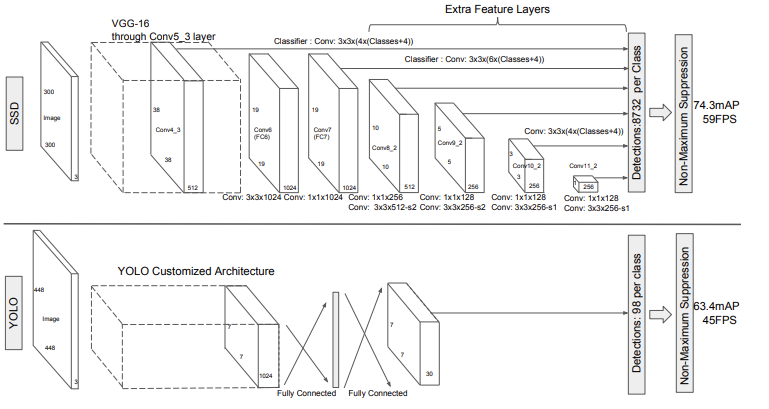

** A comparison between two single shot detection models: SSD and YOLO.
The SSD model adds several feature layers to the end of a base network, which predict
the offsets to default boxes of different scales and aspect ratios and their associated
confidences. SSD with a 300 × 300 input size significantly outperforms its 448 × 448
YOLO counterpart in accuracy on VOC2007 test while also improving the speed.**

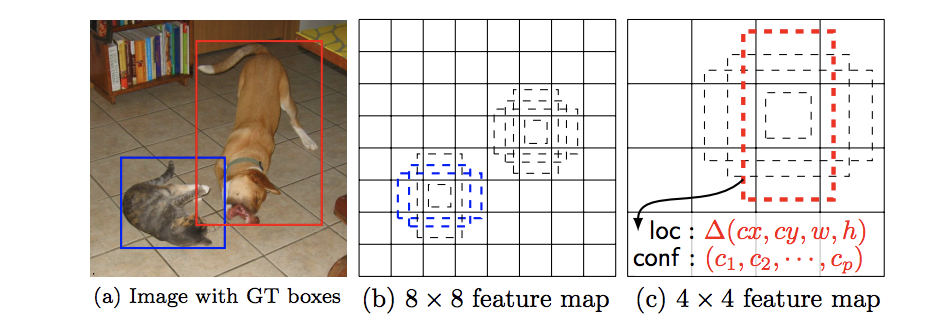


The figure above present **(a)** SSD only needs an input image and ground truth boxes for
each object during training. In a convolutional fashion, we evaluate a small set (e.g. 4)
of default boxes of different aspect ratios at each location in several feature maps with
different scales (e.g. 8 × 8 and 4 × 4 in **(b)** and **(c)**). For each default box, we predict
both the shape offsets and the confidences for all object categories ((c1, c2, · · · , cp)).
At training time, we first match these default boxes to the ground truth boxes. For
example, we have matched two default boxes with the cat and one with the dog, which
are treated as positives and the rest as negatives. The model loss is a weighted sum
between localization loss (e.g. Smooth L1) and confidence loss (e.g. Softmax).

**Matching anchor boxes with ground truth ** The first step in training needs to determine which default boxes correspond
to a ground truth detection; once this is done training the  network can proceed as normal (backprop).  Each ground
truth box is then assigned to  default/anchor boxes that vary over location, aspect ratio, and
scale. Each ground truth box is matched to the default box with the best
jaccard overlap (as in the MultiBox paper). Unlike MultiBox,  default/anchor boxes are matched to
any ground truth with jaccard overlap higher than a threshold (0.5). This simplifies the
learning problem, allowing the network to predict high scores for multiple overlapping
default boxes rather than requiring it to pick only the one with maximum overlap.

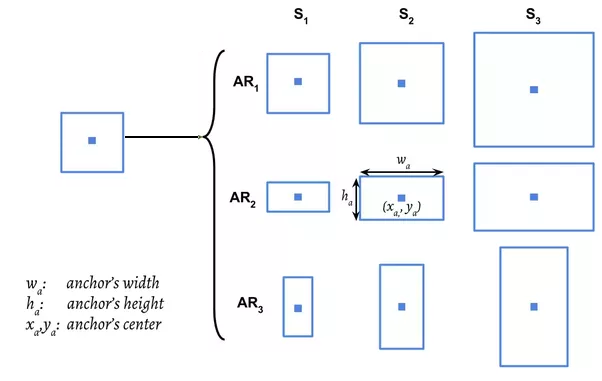

### One Stage Detector: SSD -> DSSD

#### Deconvolutional Single Shot Detection (DSSD) model
We begin by reviewing the structure of SSD and then describe
the new prediction module that produces significantly
improved training effectiveness when using Residual-101 as
the base network for SSD. Next we discuss how to add deconvolution
layers to make a hourglass network, and how
to integrate the the new deconvolutional module to pass semantic
context information for the final DSSD model.

## SSD: Single Shot MultiBox Detector
The Single Shot MultiBox Detector  is built
on top of a ”base” network that ends (or is truncated to
end) with some convolutional layers. SSD adds a series of
progressively smaller convolutional layers as shown in blue
on top of Figure 1 (the base network is shown in white).
Each of the added layers, and some of the earlier base network
layers are used to predict scores and offsets for some
predefined default bounding boxes. These predictions are
performed by 3x3x#channels dimensional filters, one filter
for each category score and one for each dimension of the
bounding box that is regressed. It uses non-maximum suppression
(NMS) to post-process the predictions to get final
detection results. More details can be found in `W. Liu, D. Anguelov, D. Erhan, S. Christian, S. Reed, C.-Y. Fu, and A. C. Berg. SSD: single shot multibox detector. In ECCV, 2016.`, where
the detector uses VGG  as the base network.
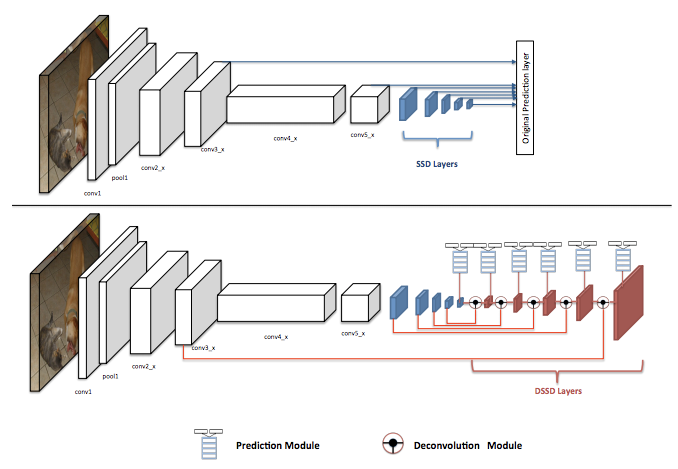

The above figure presents two single phase architectures for object detection: SSD and DSSD based on a residual network backbone. The blue modules are the layers added in the SSD framework,
and we call them SSD Layers. In the bottom figure, the red layers are DSSD layers.

## Variants of the prediction module

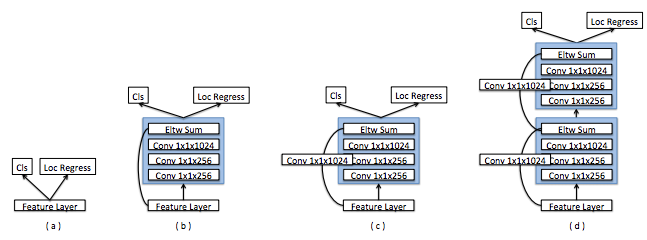

### Focal Loss

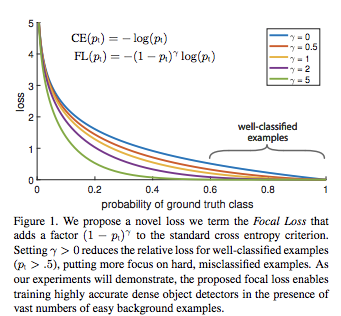



### DSSD + Focal Loss

Feature Pyramid Network Backbone: We adopt the Feature
Pyramid Network (FPN) from [T.-Y. Lin, P. Dollar, R. Girshick, K. He, B. Hariharan, and ´
S. Belongie. Feature pyramid networks for object detection.
In CVPR, 2017.](https://arxiv.org/abs/1612.03144) as the backbone
network for RetinaNet. In brief, FPN augments a standard
convolutional network with a top-down pathway and
lateral connections so the network efficiently constructs a
rich, multi-scale feature pyramid from a single resolution
input image, 


Referring to the figure below, the one-stage RetinaNet network architecture uses a Feature Pyramid Network (FPN)  backbone on top of a feedforward
ResNet architecture  (a) to generate a rich, multi-scale convolutional feature pyramid (b). To this backbone RetinaNet attaches two subnetworks, one for classifying anchor boxes (c) and one for regressing from anchor boxes to ground-truth object boxes (d). The network design is intentionally simple, which enables this work to focus on a novel focal loss function that eliminates the accuracy gap between the RetinaNet one-stage detector and state-of-the-art two-stage detectors like Faster R-CNN with FPN while running at faster speeds.

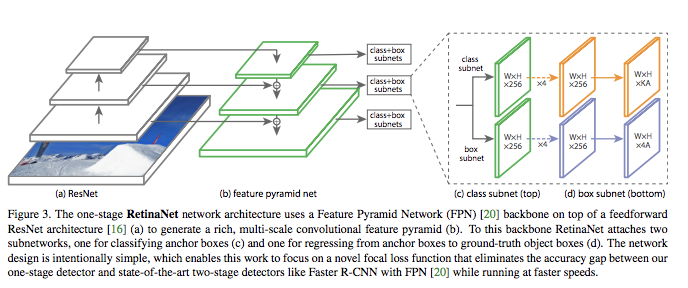




### Shared layers from the Backbone, RetinaNet Backbone (feature pyramid) and the prediction subnets 

Although the object detectors with feature pyramids (Liu
et al. 2016; Lin et al. 2017a; Lin et al. 2017b; He et al.
2017) achieve encouraging results, they still have some limitations
due to that they simply construct the feature pyramid
according to the inherent multi-scale, pyramidal architecture
of the backbones which are actually designed for object
classification task. 

* For example, as illustrated in the Figure below, SSD (Liu et al. 2016) directly and independently uses
two layers of the backbone (i.e. VGG16) and four extra layers
obtained by stride 2 convolution to construct the feature
pyramid; 
*  FPN (Lin et al. 2017a) constructs the feature pyramid by fusing the
deep and shallow layers in a top-down manner. RetinaNet is closely modeled on FPN.

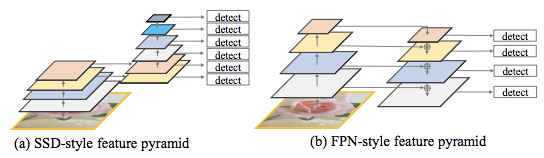

## State of the art in object detection
Below is a timeline of major object detection pipelines developed over the past 4-5 years.
* Two stage object detector like R-CNN
* Single stage object detector like RetinaNet

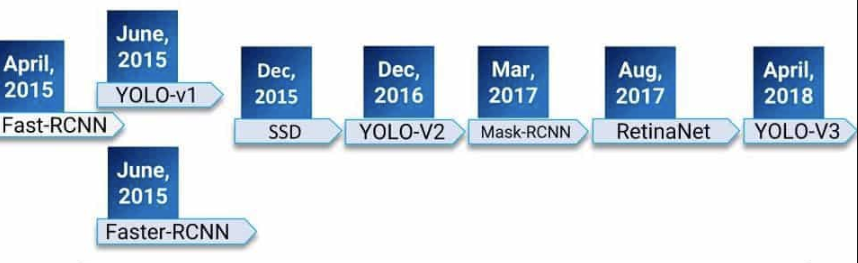

# Retinanet: under the covers 
In their RetinaNet paper, Lin et al. study what makes two-stage detectors, such as R-CNNs, (usually) more
accurate than one-stage detectors such as SSD and YOLO. In a two stage detector, we apply our
classifier to a sparse set of candidate object locations; however,in a one-stage detector, we instead
apply our classifier over a dense, regularly sampled set of possible object locations.
Two-stage detectors can sometimes be more accurate, but at the expense of computational
complexity. One-stage detectors tend to be significantly faster, simpler, and more intuitive, but may
not be as accurate.
Through their studies, Lin et al. discovered the fundamental issue with one-stage detectors is
the `extreme foreground-background class imbalance` (typically we have far more background
examples than foreground, object examples).
To remedy this, Lin et al. introduce a novel extension to standard cross-entropy loss called
Focal Loss. The Focal Loss function down-weights the loss assigned to confident (according to the
model) detected examples.
Therefore, instead of allowing the network to be overwhelmed by “easy” hard-negatives, the
Focal Loss instead “forces” the network to learn from the more challenging hard-negatives, thereby
increasing object detection accuracy.
In their experiments, Lin et al. define a dense, one-stage detector called RetinaNet which uses
the Focal Loss function. ResNet is used as the default base network which we will also be using in
this chapter as well.
Their results demonstrated that RetinaNet could match the speed of existing one-stage detectors
(SSD and YOLO) while obtaining superior object detection accuracy than two-stage, R-CNN
inspired detectors. RetinaNet therefore seeks to obtain the best of both worlds: speed and accuracy.

## RetinaNet Backbone + 2 Subnets
RetinaNet is a single, unified network composed of:
* a backbone network 
* and two task-specific subnetworks. 

The backbone is responsible for computing a convolutional feature
map over an entire input image and is an off-the-self
convolutional network. 

The two task-specific subnetworks address the bbox classification and location:

1. The first subnet performs convolutional object classification on the backbone’s output; 
* the second subnet performs convolutional bounding box regression.

The two subnetworks feature a simple design that we
propose specifically for one-stage, dense detection, see Figure
3. While there are many possible choices for the details
of these components, most design parameters are not particularly
sensitive to exact values as shown in the experiments.
We describe each component of RetinaNet next.

The one-stage RetinaNet network architecture uses a Feature Pyramid Network (FPN) backbone on top of a feedforward
ResNet architecture  (a) to generate a rich, multi-scale convolutional feature pyramid (b). To this backbone RetinaNet attaches two
subnetworks, one for classifying anchor boxes (c) and one for regressing from anchor boxes to ground-truth object boxes (d). The network
design is intentionally simple, which enables this work to focus on a novel focal loss function that eliminates the accuracy gap between our
one-stage detector and state-of-the-art two-stage detectors like Faster R-CNN with FPN [20] while running at faster speeds.

### Frozen backbone network (14M trainable, 23M non-trainable for MS Coco)

This calculation is based on the MS Coco Dataset which 80  classes for the default RetinaNet setup of 5 prediction subnets. One could potential freeze all layers up until the final prediction layeres (classification and regression)

The prediction subnets will vary in size depending on the number of classes.

In [15]:
# The weights or Trainable params of the RetinaNet Backbone and prediction subnets (ResNet50 weights are frozen)
524544 + 262400 + 131328 + 4718848 + (590080 * 4) + 2443300 + 4019920

14460660




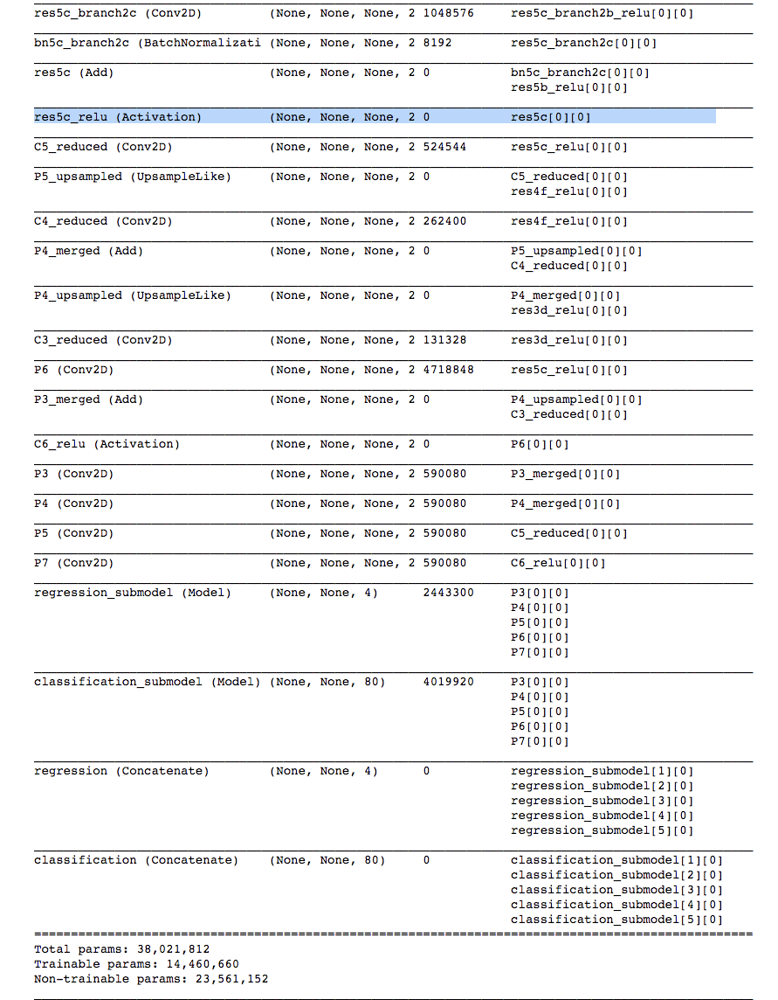

### Train all network, including ResNet50 backbone (all 38 Million parameters)

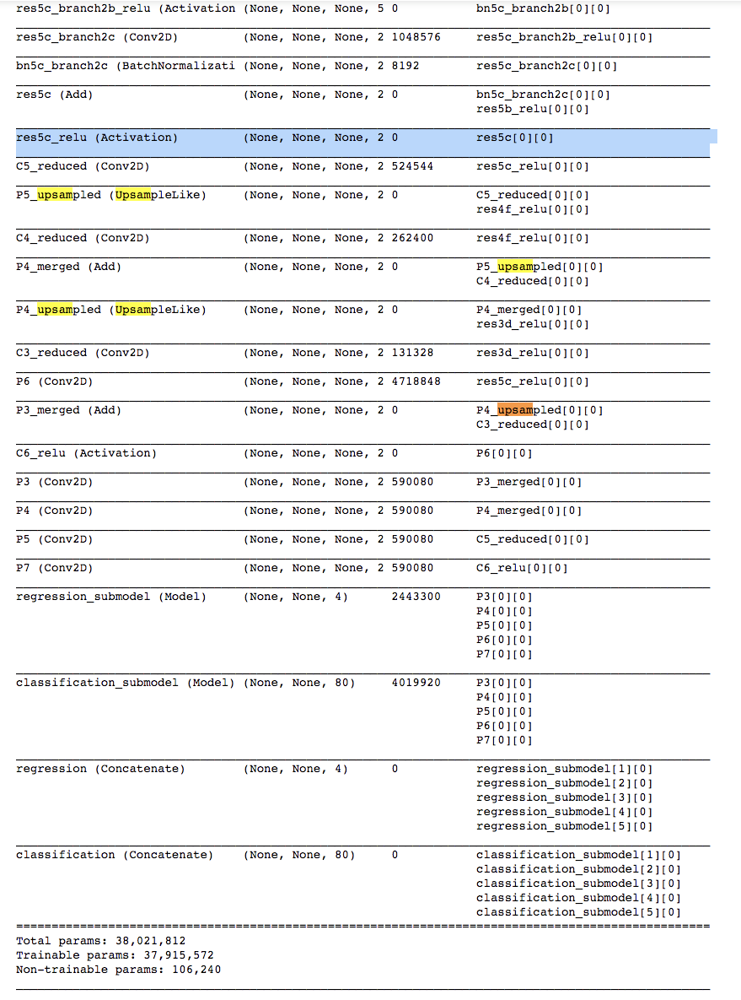

## Feature map pyramid net (FPN)

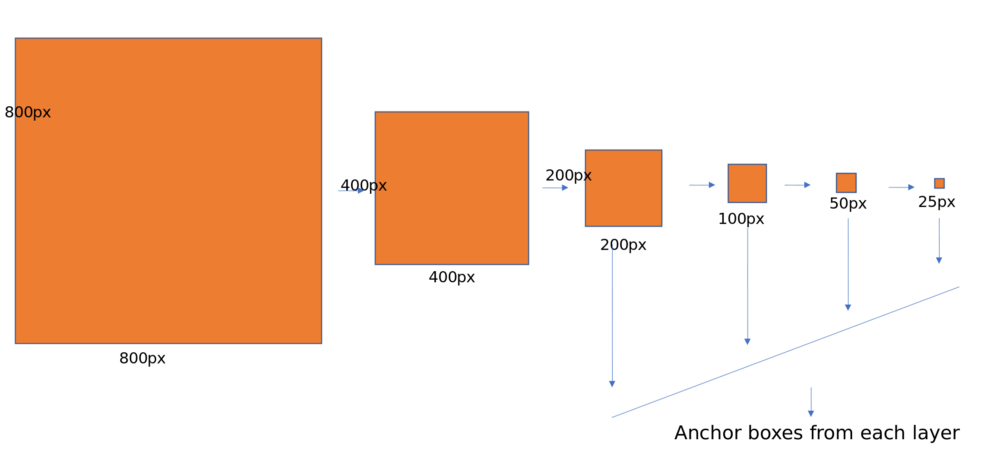



# Installing Keras RetinaNet

A  RetinaNet implementation in Keras is via the following GitHub project page:

* [RetinaNet implementation in Keras](https://github.com/fizyr/keras-retinanet)


This implementation is under active development and works with the most recent versions of Keras.

This container has preinstalled RetinaNet, so no installation is required. In the following we show how to do the following with RetinaNet:

* Set up training, testing datasets that can be used by RetinaNet for training and prediction
* Train a RetinaNet from training data (from an existing checkpoint or from scratch
* Evaluate a trained RetinaNet model on a test set
* Detect objects using a trained RetinaNet model on a test image or a directory of images

All these are presented using a small sample problem, that of detecting logos in images. Th



# The Logos Dataset

The dataset we use here to introduce the key concepts behind training and deploying a RetinaNet model is the ROMYNY Logo 2016 [Frank Fotso, 2017. Application of py_faster_rcnn in logo detection task: ZF & VGG16]( https://github.com/franckfotso/faster_rcnn_logo/blob/master/README.md), a collection of twenty popular
logo classes, such as Adidas, Facebook, BWM, Coca Cola, and others. A montage of these logos
can be seen below.

In the logos dataset there are 20 classes of logos, with a total of `935` images in the dataset, with anywhere between 19-159 images per class,
making the dataset imbalanced, but representative of what we may encounter in the real-world. 
Overall, there  are `748 training images` in the 'training' set and 187 test images. This translates into  `1393 object regions` in the training bbox+class set. 

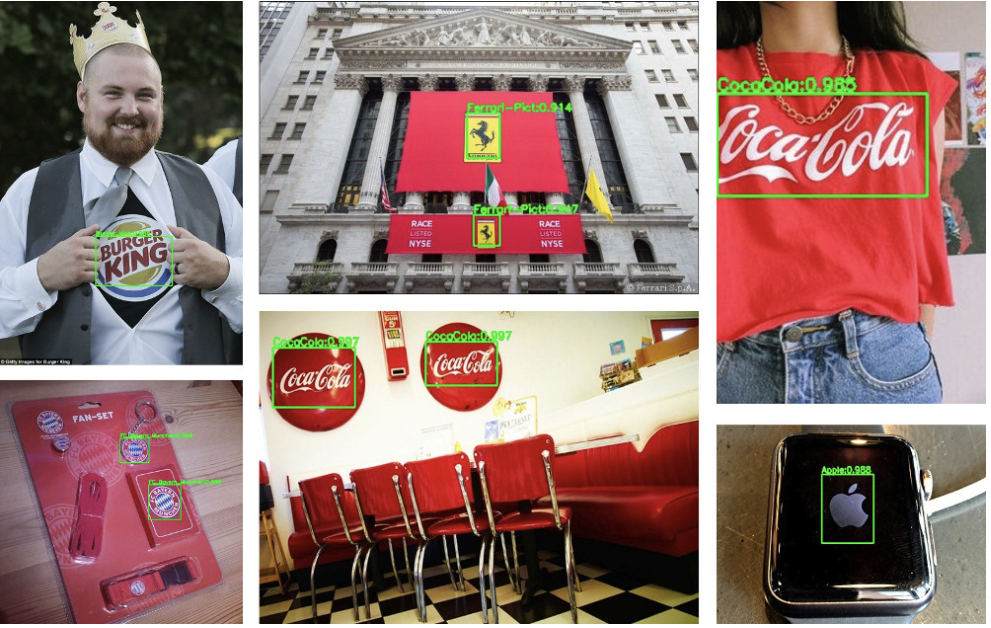

The following table includes the full breakdown on number of images per logo class for the logos dataset:

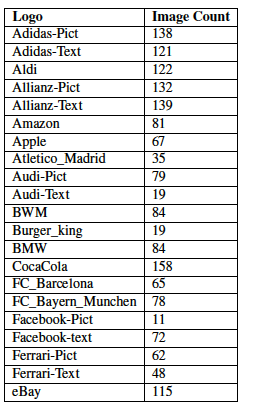

## Download Images data

In [2]:
!pwd

/root/shared/Dropbox/Projects/UniversityOFGhent-2017/dl4master/Labs/Unit-28-train-retinanet-logos


In [4]:
!ls logos

annotations  images.zip		    retinanet_test.csv	 snapshots  train.txt
images	     retinanet_classes.csv  retinanet_train.csv  test.txt


In [7]:
!ls -l logos/images|head


total 142628
-rw-r--r-- 1 root root   67994 Dec 25  2018 001637.jpg
-rw-r--r-- 1 root root   51977 Dec 25  2018 001813.jpg
-rw-r--r-- 1 root root   57598 Dec 25  2018 004221.jpg
-rw-r--r-- 1 root root   71672 Dec 25  2018 007622.jpg
-rw-r--r-- 1 root root   89977 Dec 25  2018 008634.jpg
-rw-r--r-- 1 root root   47399 Dec 25  2018 008696.jpg
-rw-r--r-- 1 root root   61107 Dec 25  2018 008906.jpg
-rw-r--r-- 1 root root  406670 Dec 25  2018 009225.jpg
-rw-r--r-- 1 root root  110090 Dec 25  2018 009944.jpg
ls: write error: Broken pipe


In [9]:
!head logos/train.txt

452893
409261
494313
622941
981220
847883
639671
372355
694084
736404


In [5]:
!ls logos/snapshots
   

ls: cannot access 'logos/snapshots/images': No such file or directory


In [ ]:
!wget https://www.dropbox.com/s/oujiytl7u4kl0ip/images.zip    
!unzip images.zip  ## unzip 
!mv images logos   #moves images folder underneath the logos folder
ls -l logos  #should have an images folder   

## Label more data using, say, LabelImg

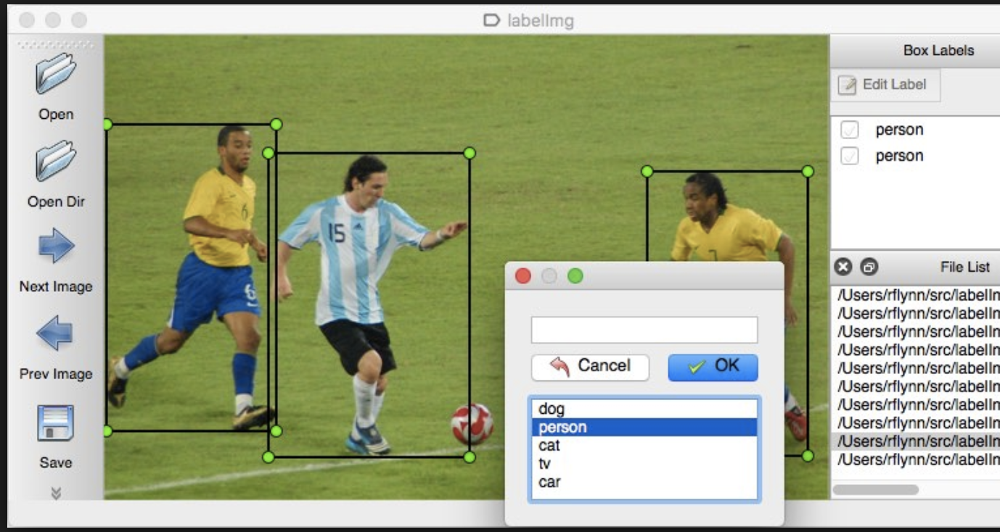


# Project: Train, evaluate RetinaNet on detect Logos

The project code for the RetinaNet object detector is based on the PyImageSearch project for logo detection. The directory structure looks like the following: 

```
|--- retinanet
| |--- config
| | |--- __init__.py
| | |--- logos_config.py
| |--- logos
| | |--- annotations
| | |--- images
| | |--- train.txt
| | |--- test.txt
| | |--- resnet50_coco_best_v2.1.0.h5
| |--- build_logos.py
| |--- predict.py```

<img src=attachment:image.png alt="Drawing" style="width: =300px;"/>
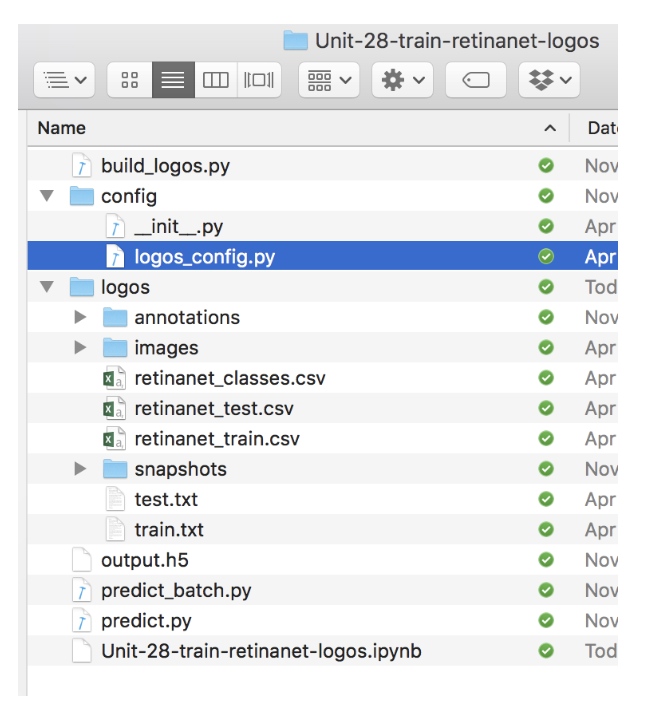

| Module| description|
|:---|----:|
|**config/logos_config.py**|The config module  store any necessary configurations to create the dataset and train the model. These configurations will be stored inside logos_config.py.|
|**logos data dir**| The logos directory contains the logos dataset itself. Here you’ll find the annotations (bounding box information), images, and training and testing split files. |

Take the time now  to explore the dataset using your terminal, Excel:

1. Investigate the logos dataset using the ls command to see how it is structured.
2. Open up the train.txt and test.txt file and note how each line contains a single integer
—the unique ID of each image in the dataset.
3. List the contents of the images directory and see how each image filename has the format
{IMAGE_ID}.jpg — this filename structure allows us to map the unique image ID to a
filename.
4. Similarly, you should explore the annotations directory and open up a few of the XML
files to see how they are structured.
We will learn how to parse and these annotation files and build the bbox+class dataset that contains rows with the following format
  * `logos/images/452893.jpg,334,177,1035,716,CocaCola`

The resnet50_coco_best_v2.1.0.h5 file is a Keras + RetinaNet model that has been pre-trained on
the COCO dataset. But we need to retrain for We will be fine-tuning this model during training. 

## Make sure to download the pretrained RetinaNet model
Make sure to download the pretrained RetinaNet model resnet50_coco_best_v2.1.0.h5. 

### Weights Init
By default, we will use the ResNet50 backbone, and the internal RetinaNet backbone layers from the pretrained RetinaNet model; the prediction subnet outer layers will be initialized randomly. 


#### Init weights for classification and regression head layers to random
Notice the following (we drop the weight for the regression and classification layers since the number of classes is different):

```
Creating model, this may take a second

/opt/conda/lib/python3.6/site-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer classification_submodel due to mismatch in shape ((3, 3, 256, 180) vs (720, 256, 3, 3)).
  weight_values[i].shape))
/opt/conda/lib/python3.6/site-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer classification_submodel due to mismatch in shape ((180,) vs (720,)).
  weight_values[i].shape))
  
  ```

This is part of the output from the `retinanet-train`

If specified all layers can be initialized randomly.


### Trainable layers
Depending on the training plan, the ResNet Backbone can be trained or left frozen during training

In [16]:
!pwd

/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos


In [27]:
#Make sure to download the pretrained model resnet50_coco_best_v2.1.0.h5
    
!wget https://github.com/fizyr/keras-retinanet/releases/download/0.5.0/resnet50_coco_best_v2.1.0.h5

DEBUG output created by Wget 1.17.1 on linux-gnu.

Reading HSTS entries from /root/.wget-hsts
URI encoding = 'ANSI_X3.4-1968'
converted 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.0/resnet50_coco_best_v2.1.0.h5' (ANSI_X3.4-1968) -> 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.0/resnet50_coco_best_v2.1.0.h5' (UTF-8)
--2018-12-24 06:38:52--  https://github.com/fizyr/keras-retinanet/releases/download/0.5.0/resnet50_coco_best_v2.1.0.h5
Resolving github.com (github.com)... 192.30.255.112, 192.30.255.113
Caching github.com => 192.30.255.112 192.30.255.113
Connecting to github.com (github.com)|192.30.255.112|:443... connected.
Created socket 3.
Releasing 0x000056524053f610 (new refcount 1).
Initiating SSL handshake.
Handshake successful; connected socket 3 to SSL handle 0x000056524053fa00
certificate:
  subject: CN=github.com,O=GitHub\\, Inc.,L=San Francisco,ST=California,C=US,serialNumber=5157550,jurisdictionST=Delaware,jurisdictionC=US,businessCategory

In [32]:
!mv resnet50_coco_best_v2.1.0.h5 logos/snapshots

In [26]:
ls -l logos/snapshots

total 0


## Prepare annoations targets: convert VOC XML style labeled bounding box records to CSV format for Keras RetinaNet


This section shows how to go from labeled logo bounding boxes for an image to the required annotation format required for training/evaluating a RetinaNet model.

Let's first look at an image and the corresponding labeled logo bounding boxes annotations that have been produced by a human labeler. The following code loads an image and its corresponding labeled logo bounding boxes.

,file_location,top_x,top_y,lower_x,lower_y,class
0,/root/shared/Dropbox/Projects/UniversityOFGhen...,334,177,1035,716,CocaCola
1,/root/shared/Dropbox/Projects/UniversityOFGhen...,271,256,341,304,CocaCola
2,/root/shared/Dropbox/Projects/UniversityOFGhen...,446,267,503,310,CocaCola
3,/root/shared/Dropbox/Projects/UniversityOFGhen...,563,246,636,286,CocaCola
4,/root/shared/Dropbox/Projects/UniversityOFGhen...,911,265,980,308,CocaCola


271 ,  256 ,  341 ,  304 ,  CocaCola
446 ,  267 ,  503 ,  310 ,  CocaCola
563 ,  246 ,  636 ,  286 ,  CocaCola
911 ,  265 ,  980 ,  308 ,  CocaCola
173 ,  294 ,  245 ,  336 ,  CocaCola


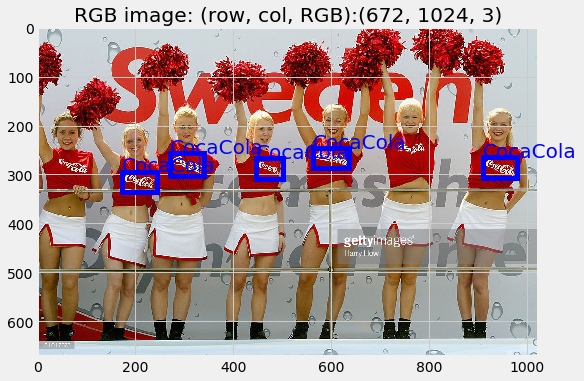

In [25]:
# import the necessary packages
import matplotlib as mpl
from matplotlib import image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.patches as patches

%matplotlib inline
plt.style.use('fivethirtyeight')

img_name = "logos/images/409261.jpg"

# NOTE:  load image via matplotlib
img = image.imread(img_name)
# NOTE:  plot image via matplotlib
fig, axs = plt.subplots(1, 1, figsize=(8,8)) 
axs.imshow(img) # visualize an array-like or PIL image
axs.set(title=f'RGB image: (row, col, RGB):{img.shape}')

df_annot = pd.read_csv("logos/retinanet_train.csv", names=["file_location", "top_x", "top_y", "lower_x", "lower_y", "class"]) #one labeled logo bounding box per line
display(df_annot.head())
img_annotations = df_annot.loc[df_annot.file_location.str.contains(img_name)]

style = dict(size=20, color='blue')
for idx,  (_,top_x, top_y, lower_x, lower_y, class_name) in img_annotations.iterrows():
    print(top_x, ", ",top_y,  ", ",lower_x,  ", ",lower_y, ", ", class_name)
    axs.text(top_x, top_y,  class_name, **style)
    # Create a Rectangle patch
    rect = axs.add_patch(patches.Rectangle((top_x, top_y ),lower_x-top_x, lower_y-top_y, linewidth=5,edgecolor='b',facecolor='none'))


Notice that this image has five labeled logo bounding boxes corresponding to CocaCola logos found in the image. Notice also that two logos were not annotated for various reasons (possibly hard to read by human eye or a human error). 

The Keras RetinaNet library utilizes two CSV files when training a RetinaNet object detector:

* **Class name to integer ID mapping**: This  CSV file contains **class name to integer ID** mapping.

* **Image annotations, class and Bounding Box CSV** One CSV file contains the image path and bounding box annotation and object class (one labeled bounding box per
line); if an image has multiple labeled bounding boxes then it will have multiple lines in this file. See figure  below for an example, where image `409261.jpg` has five (5) labeled logo bounding box regions.

The annotations file should contain one annotation per line.  Below is example of a
labeled bounding box annotation for the CocaCola logo in image file `logos/images/452893.jpg`:

`logos/images/452893.jpg,334,177,1035,716,CocaCola`

The first entry per row (record) is the path to the image. We then supply the bounding box coordinates in the
following order:

If your image has multiple
bounding boxes, you should use one row per bounding boxes.
* path where the image is store
* Start x  (corresponding to top left hand corner of the bounding box)
* Start y
* End x    (corresponding to bottom right hand corner of the bounding box)
* End y
* class label of the object in the detected within the bounding box in a human readable form.

In this case of training Keras RetinaNet, the files that will be used  are as follows:

* retinanet_train.csv 
* retinanet_classes.csv

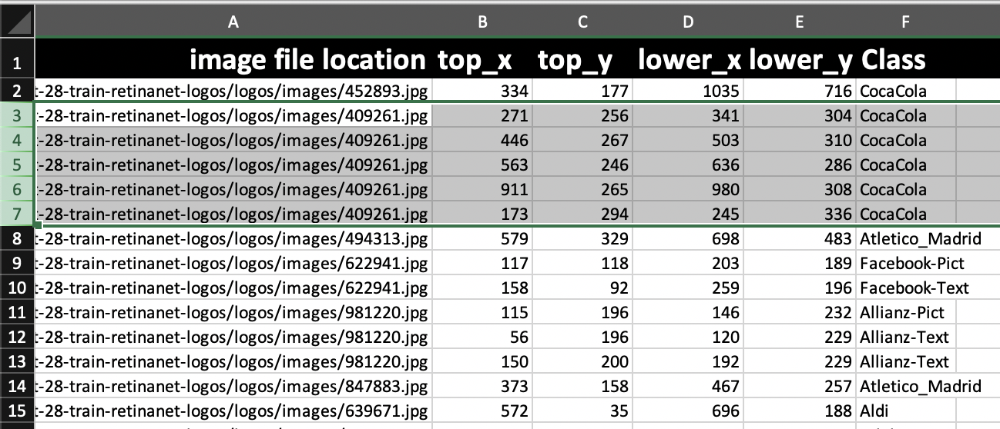

The annotations for the logos dataset are stored in PASCAL VOC format 
which serializes annotations to disk as an XML file. 

There is ONE annotation file per image detailing all the bounding boxes in that image. The following is an example of such an XML annotate file for `logos/images/452893.jpg`:


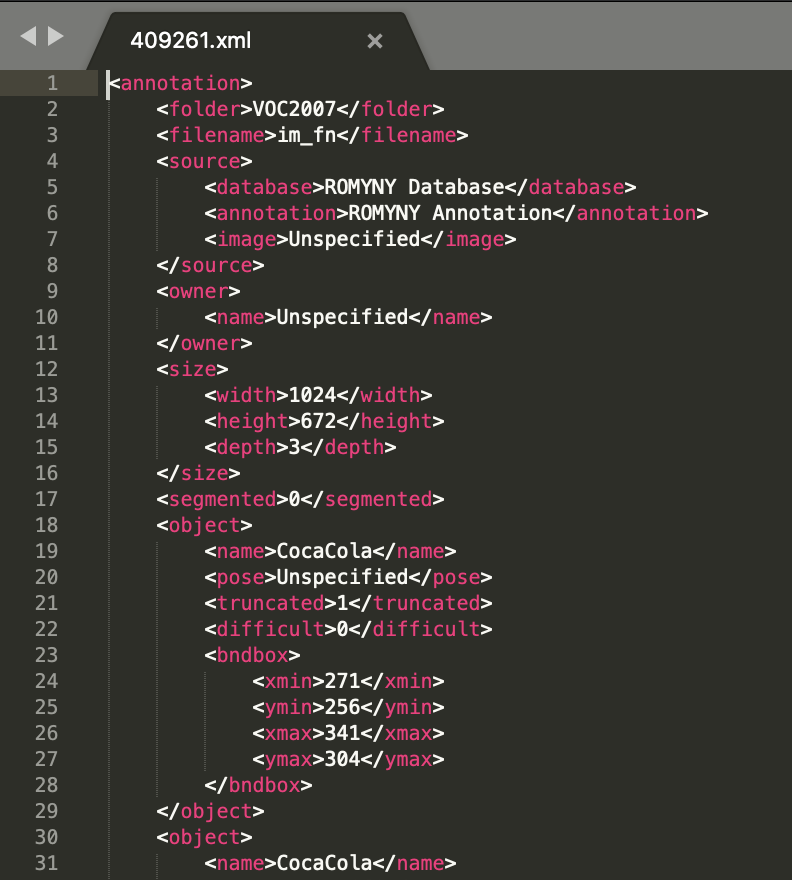

#### Code to convert the XML labeled bbox logos to RetinaNet style annotations

In [9]:
# BeautifulSoup enables parsing of  XML files with ease.  
# The annotations for the logos dataset are stored in PASCAL VOC XML format 
# which serializes annotations to disk as an XML file.  
# This XML file is easy to parse using the BeautifulSoup library.

# Install beautifulsoup4 first
!conda install -c anaconda -y beautifulsoup4

Solving environment: done

## Package Plan ##

  environment location: /opt/conda

  added / updated specs: 
    - beautifulsoup4


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2018.4.16          |           py36_0         142 KB  anaconda
    openssl-1.0.2o             |       h20670df_0         3.4 MB  anaconda
    conda-4.5.11               |           py36_0         1.0 MB  anaconda
    ca-certificates-2018.03.07 |                0         124 KB  anaconda
    beautifulsoup4-4.6.0       |   py36h49b8c8c_1         133 KB  anaconda
    ------------------------------------------------------------
                                           Total:         4.8 MB

The following packages will be UPDATED:

    beautifulsoup4:  4.6.0-py36h49b8c8c_1 --> 4.6.0-py36h49b8c8c_1 anaconda
    ca-certificates: 2018.03.07-0         --> 2018.03.07-0         anaconda
    certifi:         2018

Reformating the labeled bounding box records annotations runs off of the following config file: 

In [19]:
%%writefile config/logos_config.py

# import the necessary packages
import os

# initialize the base path for the logos dataset
BASE_PATH = "logos"
BASE_PATH = "/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos/logos"

# build the path to the annotations and input images
ANNOT_PATH = os.path.sep.join([BASE_PATH, "annotations"])
IMAGES_PATH = os.path.sep.join([BASE_PATH, "images"])

# build the path to the *input* training and testing .txt files
TRAIN_TXT = os.path.sep.join([BASE_PATH, "train.txt"])
TEST_TXT = os.path.sep.join([BASE_PATH, "test.txt"])

# build the path to the *output* training and test .csv files
TRAIN_CSV = os.path.sep.join([BASE_PATH, "retinanet_train.csv"])
TEST_CSV = os.path.sep.join([BASE_PATH, "retinanet_test.csv"])

# build the path to the output classes CSV file
CLASSES_CSV = os.path.sep.join([BASE_PATH, "retinanet_classes.csv"])


Overwriting config/logos_config.py


In [ ]:
%%writefile build_logos.py
# USAGE
# python build_logos.py

# import the necessary packages
from config import logos_config as config
from bs4 import BeautifulSoup
import os

# initialize the set of classes we have encountered so far
CLASSES = set()

# create the list of datasets to build
datasets = [
    # 
    ("train", config.TRAIN_TXT, config.TRAIN_CSV),
    ("test", config.TEST_TXT, config.TEST_CSV),
]

# loop over the train and test datasets
for (dType, inputTxt, outputCSV) in datasets:
    # load the contents of the input data split
    print("[INFO] starting '{}' set...".format(dType))
    
    #loads the inputTxt file which contains the image IDs for the 
    #particular data split (either “training” or “testing”).
    imageIDs = open(inputTxt).read().strip().split("\n")
    print("[INFO] {} total images in '{}' set".format(
        len(imageIDs), dType))

    # open the output CSV file
    # Output a bbox per line: logos/images/452893.jpg,334,177,1035,716,CocaCola
    csv = open(outputCSV, "w")

    # loop over the image IDs
    for imageID in imageIDs:
        # build the path to the image path and annotation file
        imagePath = "{}.jpg".format(os.path.sep.join([
            config.IMAGES_PATH, imageID]))
        annotPath = "{}.xml".format(os.path.sep.join([
            config.ANNOT_PATH, imageID]))

        # load the annotation file, build the soup, and initialize
        # the set of coordinates for this particular image
        contents = open(annotPath).read()
        soup = BeautifulSoup(contents, "html.parser")
        coords = set()

        # extract the image dimensions
        w = int(soup.find("width").string)
        h = int(soup.find("height").string)

        # loop over all `object` elements
        for o in soup.find_all("object"):
            # extract the label and bounding box coordinates
            label = o.find("name").string
            xMin = int(o.find("xmin").string)
            yMin = int(o.find("ymin").string)
            xMax = int(o.find("xmax").string)
            yMax = int(o.find("ymax").string)

            # truncate any bounding box coordinates that may fall
            # outside the boundaries of the image
            xMin = max(0, xMin)
            yMin = max(0, yMin)
            xMax = min(w, xMax)
            yMax = min(h, yMax)

            # build a (hashable) tuple from the coordinates
            coord = (xMin, yMin, xMax, yMax)

            # if the coordinates already exist in our `coords` set,
            # ignore the annotation (this is a peculiarity of the
            # logos dataset)
            if coord in coords:
                continue

            # write the image path, bounding box coordinates, and
            # label to the output CSV file
            row = [os.path.abspath(imagePath), str(xMin), str(yMin),
                str(xMax), str(yMax), label]
            csv.write("{}\n".format(",".join(row)))

            # add the bounding box coordinates to our set and update
            # the set of class labels
            coords.add(coord)
            CLASSES.add(label)

    # close the output CSV file
    csv.close()

# write the classes to file
print("[INFO] writing classes...")
csv = open(config.CLASSES_CSV, "w")
rows = [",".join([c, str(i)]) for (i, c) in enumerate(CLASSES)]
csv.write("\n".join(rows))
csv.close()



In [20]:
# Read annotations/imgID.xml and 
# GENERATATES the from files from XML annotations file
#  --- retinanet_train.csv   # a row for each bbox
#  --- retinanet_test.csv    # a row for each bbox
#  --- retinanet_classes.csv # class string to ID table

!python build_logos.py

[INFO] starting 'train' set...
[INFO] 748 total images in 'train' set
[INFO] starting 'test' set...
[INFO] 187 total images in 'test' set
[INFO] writing classes...


In [22]:
#look at the first few lines of the test file (bboxes)
!wc -l logos/retinanet_test.csv
!head logos/retinanet_test.csv

342 logos/retinanet_test.csv
/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos/logos/images/174992.jpg,290,126,373,169,eBay
/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos/logos/images/845964.jpg,121,367,213,444,Burger_king
/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos/logos/images/845964.jpg,433,335,505,411,Burger_king
/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos/logos/images/238423.jpg,5,156,197,337,BMW
/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos/logos/images/238423.jpg,190,109,370,282,BMW
/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos/logos/images/238423.jpg,375,77,550,258,BMW
/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-t

In [23]:
!wc -l logos/retinanet_train.csv


1393 logos/retinanet_train.csv


## Training RetinaNet to Detect Logos

To train RetinaNet on the logos dataset you need to use either the `retinanet-train` command or
`train.py script` included with the Keras RetinaNet repository (located in `keras-retinanet-master/keras_retinanet/bin/train.py`). Your `retinanet-train` command
should follow the template below:

```bash 
retinanet-train --batch-size BATCH_SIZE --steps NUM_STEPS \
     --epochs NUM_EPOCHS --weights COCO_WEIGHTS_PATH \
     --snapshot-path SNAPSHOT_DIRECTORY \
     csv TRAIN.CSV CLASSES.CSV 
```

In particular, you’ll need to supply the:

* Batch size
* Number of steps per epoch
* Total number of epochs to train for
* Path to the COCO weights file (optional, only supplied when fine-tuning)
* Path to the output snapshot directory to store serialized model weights after each epoch
* And finally, the paths to the training and classes CSV files

Using my GTX 1080Ti, I was able utilize a batch size of four; however, you may need to tweak
this value to either one or two depending on memory limitations of your GPU.

Once you have determined your batch size, you need to compute the number of steps per epoch.
This can be done by counting the number of annotations in your retinanet_train.csv file:

In [10]:
!wc -l logos/retinanet_train.csv
# 1393 logos/retinanet_train.csv

1393 logos/retinanet_train.csv


In [36]:
1393/2

696.5

The wc command reveals their are 1,393 lines in the retinanet_train.csv file. Since each
line represents a single annotation, there are thus 1,393 annotations in the file. With a batch size of
two (**a minibatch size of four cause memory problems** ), I can now compute the number of steps per epoch:

$$1393/2 = 696.5 $$

Rounding up, there are a total of 697 steps per epoch. Given these values, I was ready to start
training with the following command:

## Crosscheck the following before training

1. The GPUs are free 
  * To check if you really are utilizing all of your GPUs, specifically NVIDIA ones, you can monitor your usage in the terminal using:
  
  * ```watch -n0.5 nvidia-smi```
  * Otherwise you will see `CUDA_ERROR_OUT_OF_MEMORY` 
  *  ```
2018-12-25 01:14:44.367854: E tensorflow/stream_executor/cuda/cuda_driver.cc:806] failed to allocate 5.33M (5590016 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory
2018-12-25 01:14:44.368527: E tensorflow/stream_executor/cuda/cuda_driver.cc:806] failed to allocate 5.33M (5590016 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory```
*  Make sure batch size is not too big nor too small!
* Make sure ResNet50 backbone parameters are frozen. Then there will be only `13,215,960` trainable parameters out of `36,777,112` total paramters (as opposed `38M` parameter for *MS Coco* models with 80 classes): ```

```
Total params: 36,777,112
Trainable params: 13,215,960
Non-trainable params: 23,561,152
```


### Init weights for classification and regression head layers to random
Notice the following (we drop the weights for the regression and classification layers since the number of classes is different), 20 logo classes versus 80 in MsCoco:

```
Creating model, this may take a second

/opt/conda/lib/python3.6/site-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer classification_submodel due to mismatch in shape ((3, 3, 256, 180) vs (720, 256, 3, 3)).
  weight_values[i].shape))
/opt/conda/lib/python3.6/site-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer classification_submodel due to mismatch in shape ((180,) vs (720,)).
  weight_values[i].shape))
  
  ```

This above snipper is  part of the output trace from running `retinanet-train` on the Logos dataset (see below for more details).

### Train on a Single GPU mode

#### Resnet 50 backbone architecture

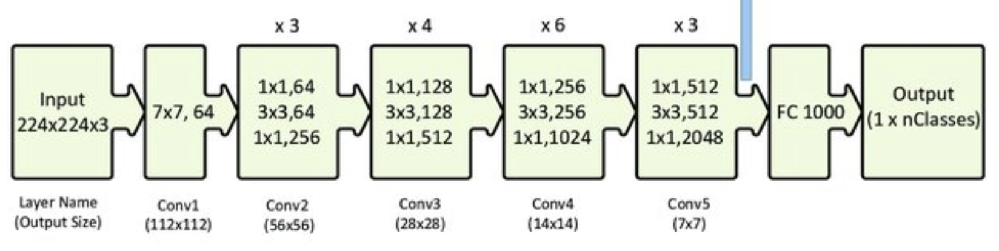

The above figure depicts `ResNet50`. Notice how each of the Resnet Blocks  are named: Conv2-5, and where Conv1 corresponds to a regular 2D convolutional layer with 64 kerels that operate on the input image. In this implementation the input image is rescaled to a minimum side of 800 pixels (see below for an example of rescaling not just the image but also the bounding boxes corresponding to objects.

The following subgraph corresponding to the Conv2 block from ResNet50. This visualization was generated using the `Netron` system (available [here](https://lutzroeder.github.io/netron/) for visualizing any neural network architecture. 

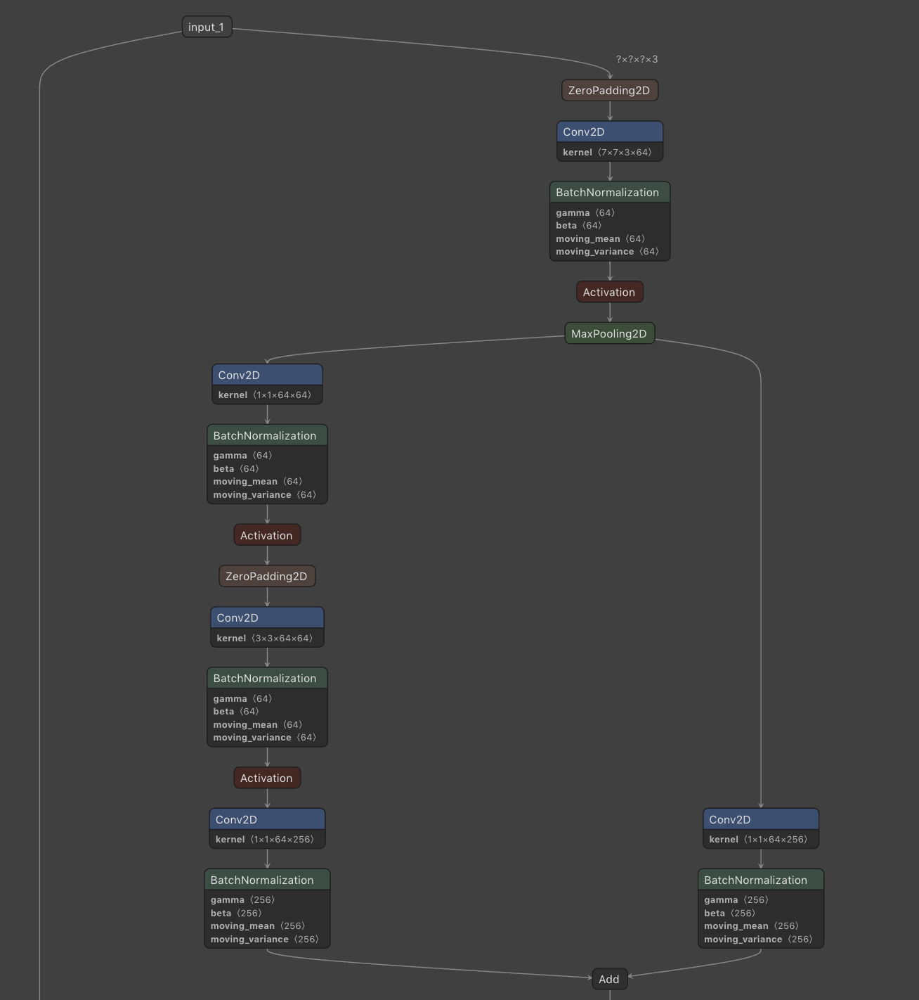

In [65]:
!less config/config.ini

/bin/sh: 1: less: not found


In [44]:
# Single GPU mode takes 2.5 minutes per epoch on an NVIDIA GTI 1080Ti GPU card (single GPU)
%time
!retinanet-train --batch-size 2 --steps 697 --epochs 50 \
   --weights logos/snapshots/resnet50_coco_best_v2.1.0.h5 \
   --snapshot-path logos/snapshots \
   --freeze-backbone \
   csv logos/retinanet_train.csv logos/retinanet_classes.csv

/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
2018-12-24 11:22:36.973604: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2018-12-24 11:22:37.157941: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1432] Found device 0 with properties: 
name: GeForce GTX 1080 Ti major: 6 minor: 1 memoryClockRate(GHz): 1.582
pciBusID: 0000:05:00.0
totalMemory: 10.92GiB freeMemory: 10.20GiB
2018-12-24 11:22:37.279664: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1432] Found device 1 with properties: 
name: GeForce GTX 1080 Ti major: 6 minor: 1 memoryClockRate(GHz): 1.582
pciBusID: 0000:06:00.0
totalMemory: 10.92GiB freeM

#### Resume training from a previous checkpoint

In [60]:
!mv logos/snapshots/resnet50_csv_49.h5 logos/snapshots/resnet50_csv_49_checkpoint.h5 

In [ ]:
# Single GPU mode
%time
!retinanet-train --batch-size 2 --steps 697 --epochs 50 \
   --weights logos/snapshots/resnet50_csv_49_checkpoint.h5 \
   --snapshot-path logos/snapshots \
   --freeze-backbone \
   csv logos/retinanet_train.csv logos/retinanet_classes.csv



CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 8.82 µs
/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
2018-12-25 02:43:47.819119: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2018-12-25 02:43:47.974306: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1432] Found device 0 with properties: 
name: GeForce GTX 1080 Ti major: 6 minor: 1 memoryClockRate(GHz): 1.582
pciBusID: 0000:05:00.0
totalMemory: 10.92GiB freeMemory: 10.27GiB
2018-12-25 02:43:48.104091: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1432] Found device 1 with properties: 
name: GeForce GTX 1080 Ti major: 6 minor: 1 memoryClockRat

1393/8

### Train on 4 GPUs

As of December 2018, using Keras (Keras 2.2.4) to train with multiple GPUs leads to unstable results. See my 3 attempts below, that do not converge to good results quickly. Training with one GPU leads to better results.  With 1 GPU training leads to better convergence after 50 epoches (compared 50 epoches using 4 GPUs over three trial training runs)




In [59]:
!python -c 'import keras; print(keras.__version__)'

/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
2.2.4


#### Train on 4 GPUs Run 1 of 3: `--multi-gpu 4`


In [42]:
# Use all 4 GPUs  
# minibatch size is 2 = 8/4 gpus 
%time
!retinanet-train --batch-size 8 --steps 175 --epochs 50 \
   --weights logos/snapshots/resnet50_coco_best_v2.1.0.h5 \
   --multi-gpu 4  --multi-gpu-force \
   --snapshot-path logos/snapshots \
   --freeze-backbone \
   csv logos/retinanet_train.csv logos/retinanet_classes.csv

/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
2018-12-24 07:04:00.821684: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2018-12-24 07:04:00.967295: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1432] Found device 0 with properties: 
name: GeForce GTX 1080 Ti major: 6 minor: 1 memoryClockRate(GHz): 1.582
pciBusID: 0000:05:00.0
totalMemory: 10.92GiB freeMemory: 10.27GiB
2018-12-24 07:04:01.101322: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1432] Found device 1 with properties: 
name: GeForce GTX 1080 Ti major: 6 minor: 1 memoryClockRate(GHz): 1.582
pciBusID: 0000:06:00.0
totalMemory: 10.92GiB freeM

#### Train on 4 GPUs again

In [46]:
# Use all 4 GPUs  
# minibatch size is 2 = 8/4 gpus 
dir = "logos/snapshots/4GPUs_run2"
!mkdir dir

In [47]:
# Use all 4 GPUs  
# minibatch size is 2 = 8/4 gpus 
dir = "logos/snapshots/4GPUs_run2"
!mkdir dir
%time
!retinanet-train --batch-size 8 --steps 175 --epochs 50 \
   --weights logos/snapshots/resnet50_coco_best_v2.1.0.h5 \
   --multi-gpu 4  --multi-gpu-force \
   --snapshot-path logos/snapshots \
   --freeze-backbone \
   csv logos/retinanet_train.csv logos/retinanet_classes.csv

mkdir: cannot create directory 'dir': File exists
CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 4.77 µs
/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
2018-12-24 15:53:32.827362: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2018-12-24 15:53:32.966580: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1432] Found device 0 with properties: 
name: GeForce GTX 1080 Ti major: 6 minor: 1 memoryClockRate(GHz): 1.582
pciBusID: 0000:05:00.0
totalMemory: 10.92GiB freeMemory: 10.20GiB
2018-12-24 15:53:33.101769: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1432] Found device 1 with properties: 
name: Ge

#### Train on 4 GPUs again

In [56]:
%time
dir = "logos/snapshots/4GPUs_run3"
!mkdir $dir
# Use all 4 GPUs  
# minibatch size is 2 = 8/4 gpus 


CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 5.48 µs
mkdir: cannot create directory 'logos/snapshots/4GPUs_run3': File exists


In [57]:
%time
dir = "logos/snapshots/4GPUs_run3"
!retinanet-train --batch-size 8 --steps 175 --epochs 50 \
   --weights logos/snapshots/resnet50_coco_best_v2.1.0.h5 \
   --multi-gpu 4  --multi-gpu-force \
   --snapshot-path $dir \
   --freeze-backbone \
   csv logos/retinanet_train.csv logos/retinanet_classes.csv

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 5.72 µs
/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
2018-12-24 18:54:44.965906: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2018-12-24 18:54:45.107728: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1432] Found device 0 with properties: 
name: GeForce GTX 1080 Ti major: 6 minor: 1 memoryClockRate(GHz): 1.582
pciBusID: 0000:05:00.0
totalMemory: 10.92GiB freeMemory: 10.20GiB
2018-12-24 18:54:45.254656: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1432] Found device 1 with properties: 
name: GeForce GTX 1080 Ti major: 6 minor: 1 memoryClockRat

In [12]:
!pwd


/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos


## Exporting Detection Model
Before we can evaluate our RetinaNet model or apply it to predict objects in our own images,
we first need to export the model. Exporting our model can be accomplished by using the
retinanet-convert-model command:

```bash 
$ retinanet-convert-model logos/snapshots/resnet50_csv_50.h5 output.h5
```

After exporting, we can now use the output.h5 file for evaluation and prediction (the
resnet50_csv_50.h5  file by itself cannot be used).

In [74]:
!retinanet-convert-model logos/snapshots/resnet50_csv_49_checkpoint.h5 logos/snapshots/deploymentModel_resnet50_csv_49.h5

/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
2018-12-24 22:40:35.621256: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2018-12-24 22:40:35.644252: E tensorflow/stream_executor/cuda/cuda_driver.cc:300] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2018-12-24 22:40:35.644308: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:163] retrieving CUDA diagnostic information for host: 727182d539a6
2018-12-24 22:40:35.644320: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:170] hostname: 727182d539a6
2018-12-24 22:40:35.644388: I tensorflow/stream_executor/cuda/cuda_diagnost

In [66]:
!ls -l logos/snapshots/resnet50_csv_49_checkpoint.h5

-rw-r--r-- 1 root root 147671304 Dec 24 18:02 logos/snapshots/resnet50_csv_49_checkpoint.h5


In [75]:
!ls -l logos/snapshots/deploymentModel_resnet50_csv_49.h5  #147 Meg of a model

-rw-r--r-- 1 root root 147682832 Dec 24 22:40 logos/snapshots/deploymentModel_resnet50_csv_49.h5


## Evaluating Detection Model
To evaluate our model on a testing set or holdout set, we can use the retinanet-evaluate
command:

```bash
## pretrained and converted model
retinanet-evaluate csv logos/retinanet_test.csv \
       logos/retinanet_classes.csv output.h5
## newly trained model
retinanet-evaluate csv logos/retinanet_test.csv \
       logos/retinanet_classes.csv logos/snapshots/deploymentModel_resnet50_csv_49
 ```
 
 Note: There are `187`  images in the `test` set. Here is a sample output. (One should be able to get a mAP of 0.63)
 
 ``` 
 Running network: 100% (187 of 187) |#####| Elapsed Time: 0:01:05 Time:  0:01:05
Parsing annotations: 100% (187 of 187) |#| Elapsed Time: 0:00:00 Time:  0:00:00
4 instances of class Atletico_Madrid with average precision: 0.8500
18 instances of class BMW with average precision: 0.8113
21 instances of class Adidas-Text with average precision: 0.3239
1 instances of class Facebook-Pict with average precision: 0.0093
25 instances of class Adidas-Pict with average precision: 0.3025
13 instances of class Apple with average precision: 0.7868
23 instances of class Allianz-Pict with average precision: 0.5813
13 instances of class Facebook-Text with average precision: 0.4135
16 instances of class Audi-Pict with average precision: 0.4667
5 instances of class Audi-Text with average precision: 0.0226
23 instances of class FC_Bayern_Munchen with average precision: 0.7207
16 instances of class FC_Barcelona with average precision: 0.4648
12 instances of class Ferrari-Pict with average precision: 0.5220
36 instances of class eBay with average precision: 0.5270
15 instances of class Ferrari-Text with average precision: 0.2412
22 instances of class Allianz-Text with average precision: 0.2726
30 instances of class CocaCola with average precision: 0.6630
17 instances of class Burger_king with average precision: 0.6225
13 instances of class Amazon with average precision: 0.4121
19 instances of class Aldi with average precision: 0.5349
mAP using the weighted average of precisions among classes: 0.5082
mAP: 0.4774
```
 
 
Overall, we are obtaining 47.74  mAP (one should be able to get around 63% mAP; see task below) which is quite good given our limited amount of
training data. There are a couple of  logos our model really struggled with:
 *  Facebook
 *  Audi-Text logo

This is likely to change with some more training (see task below!)
However, other class labels such as `Atletico Madrid` and
`BMW` were always detected.

In [63]:
!wc -l logos/retinanet_test.csv 

342 logos/retinanet_test.csv


In [76]:
!retinanet-evaluate csv logos/retinanet_test.csv \
       logos/retinanet_classes.csv logos/snapshots/deploymentModel_resnet50_csv_49.h5

/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
2018-12-24 22:41:10.668740: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2018-12-24 22:41:10.792275: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1432] Found device 0 with properties: 
name: GeForce GTX 1080 Ti major: 6 minor: 1 memoryClockRate(GHz): 1.582
pciBusID: 0000:05:00.0
totalMemory: 10.92GiB freeMemory: 10.20GiB
2018-12-24 22:41:10.915720: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1432] Found device 1 with properties: 
name: GeForce GTX 1080 Ti major: 6 minor: 1 memoryClockRate(GHz): 1.582
pciBusID: 0000:06:00.0
totalMemory: 10.92GiB freeM

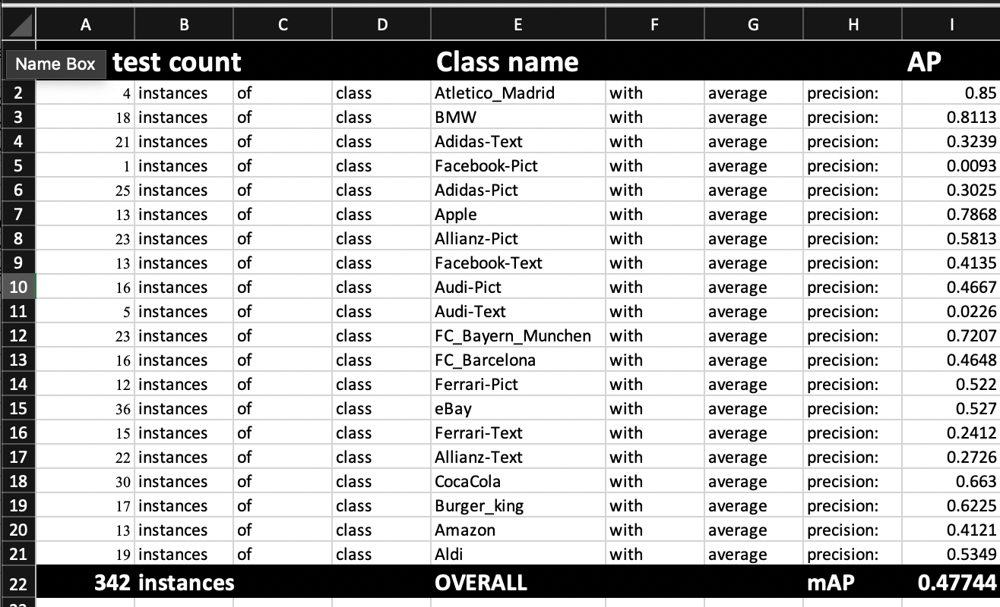

## TASK
One should be able to get a mAP of 0.63 (or more!) for the Logo Test set. Please train a RetinaNet Model to accomplish this. (HINT: more epochs of training should help a lot!)


### Visualize a test image and scale it to be correct size for retinaNet. Rescale the bounding boxes also!

In [67]:
!head logos/retinanet_train.csv

image file location,top_x,top_y,lower_x,lower_y,Class
/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos/logos/images/452893.jpg,334,177,1035,716,CocaCola
/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos/logos/images/409261.jpg,271,256,341,304,CocaCola
/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos/logos/images/409261.jpg,446,267,503,310,CocaCola
/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos/logos/images/409261.jpg,563,246,636,286,CocaCola
/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos/logos/images/409261.jpg,911,265,980,308,CocaCola
/root/shared/Dropbox/Projects/UniversityOFGhent-2017/Src/dl4master/Labs/Unit-28-train-retinanet-logos/logos/images/409261.jpg,173,294,245,336,CocaCola
/root/shared/Dropbox/Projects/Universit

scale:1.1904761904761905;  img.shape: (672, 1024, 3)
scale:1.1904761904761905;  img.shape: [800.0, 1219]
img_scaled, scale(800, 1219, 3), 1.1904761904761905
{'file_location': 'str', 'top_x': 'int', 'top_y': 'int', 'lower_x': 'int', 'lower_y': 'int', 'class': 'str'}
<class 'dict'>


,file_location,top_x,top_y,lower_x,lower_y,class
0,/root/shared/Dropbox/Projects/UniversityOFGhen...,334,177,1035,716,CocaCola
1,/root/shared/Dropbox/Projects/UniversityOFGhen...,271,256,341,304,CocaCola
2,/root/shared/Dropbox/Projects/UniversityOFGhen...,446,267,503,310,CocaCola
3,/root/shared/Dropbox/Projects/UniversityOFGhen...,563,246,636,286,CocaCola
4,/root/shared/Dropbox/Projects/UniversityOFGhen...,911,265,980,308,CocaCola


271 ,  256 ,  341 ,  304 ,  CocaCola
446 ,  267 ,  503 ,  310 ,  CocaCola
563 ,  246 ,  636 ,  286 ,  CocaCola
911 ,  265 ,  980 ,  308 ,  CocaCola
173 ,  294 ,  245 ,  336 ,  CocaCola
322.6190476190476 ,  304.76190476190476 ,  405.95238095238096 ,  361.9047619047619 ,  CocaCola
530.952380952381 ,  317.85714285714283 ,  598.8095238095239 ,  369.04761904761904 ,  CocaCola
670.2380952380952 ,  292.85714285714283 ,  757.1428571428571 ,  340.4761904761905 ,  CocaCola
1084.5238095238094 ,  315.4761904761905 ,  1166.6666666666667 ,  366.6666666666667 ,  CocaCola
205.95238095238096 ,  350.0 ,  291.6666666666667 ,  400.0 ,  CocaCola


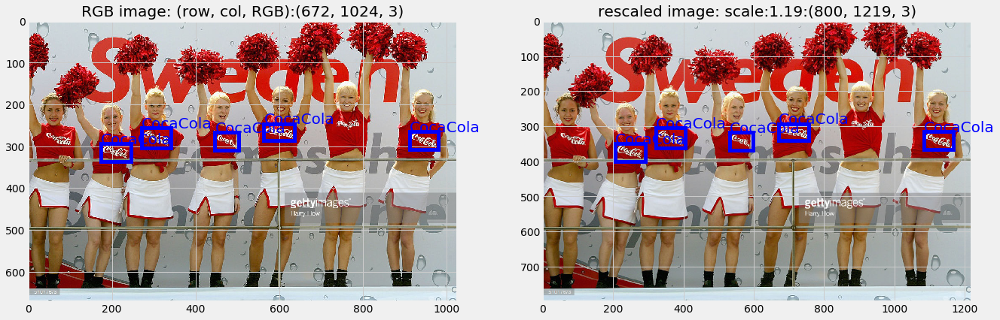

In [79]:
# import the necessary packages
import matplotlib as mpl
from matplotlib import image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.patches as patches
from skimage import data, exposure, feature, transform, color

%matplotlib inline
plt.style.use('fivethirtyeight')


def compute_resize_scale_ex(image_shape, min_side=800, max_side=1333):
    """ 
    Compute an image scale such that the image size is constrained to min_side and max_side.
    
    Args
        min_side: The image's min side will be equal to min_side after resizing.
        max_side: If after resizing the image's max side is above max_side, resize until the max side is equal to max_side.
    Returns
        A resizing scale.
    """
    (rows, cols, _) = image_shape

    smallest_side = min(rows, cols)

    # rescale the image so the smallest side is min_side
    scale = min_side / smallest_side

    # check if the largest side is now greater than max_side, which can happen
    # when images have a large aspect ratio
    largest_side = max(rows, cols)
    if largest_side * scale > max_side:
        scale = max_side / largest_side

    return scale

def resize_image_ex(img, min_side=800, max_side=1333):
    """ This code is shown here for demo purposes only
    Resize an image such that the size is constrained to min_side and max_side.
    Args
        min_side: The image's min side will be equal to min_side after resizing.
        max_side: If after resizing the image's max side is above max_side, resize until the max side is equal to max_side.
    Returns
        A resized image.
    """
    # compute scale to resize the image
    scale = compute_resize_scale_ex(img.shape, min_side=min_side, max_side=max_side)
    print(f"scale:{scale};  img.shape: {img.shape}")
    print(f"scale:{scale};  img.shape: {[int(img.shape[0])*scale, int(img.shape[1]*scale)]}")
    # resize the image with the computed scale
    #img = cv2.resize(img, None, fx=scale, fy=scale)
    img = transform.resize(img, [int(img.shape[0])*scale, int(img.shape[1]*scale)]) 
    return img, scale


img_name = "logos/images/409261.jpg"

# NOTE:  load image via matplotlib
img = image.imread(img_name)
img_scaled, scale = resize_image_ex(img, min_side=800, max_side=1333)
print(f"img_scaled, scale{img_scaled.shape}, {scale}")

# NOTE:  plot image via matplotlib
fig, axs = plt.subplots(1, 2, figsize=(20,10)) 
axs[0].imshow(img) # visualize an array-like or PIL image
axs[0].set(title=f'RGB image: (row, col, RGB):{img.shape}')

axs[1].imshow(img_scaled) # visualize an array-like or PIL image
axs[1].set(title=f'rescaled image: scale:{scale:.3}:{img_scaled.shape}')
names = ["file_location", "top_x", "top_y", "lower_x", "lower_y", "class"]
dtypes = {name_:type_ for  name_,type_ in zip(names, ["str", "int","int", "int", "int", "str"])}  #one labeled logo bounding box per line 
print(dtypes)
print(type(dtypes))
df_annot = pd.read_csv("logos/retinanet_train.csv", names=names, dtype=dtypes) 
display(df_annot.head())
img_annotations = df_annot.loc[df_annot.file_location.str.contains(img_name)]

style = dict(size=20, color='blue')
for idx,  (_,top_x, top_y, lower_x, lower_y, class_name) in img_annotations.iterrows():
    print(top_x, ", ",top_y,  ", ",lower_x,  ", ",lower_y, ", ", class_name)
    axs[0].text(top_x, top_y,  class_name, **style)
    # Create a Rectangle patch
    rect = axs[0].add_patch(patches.Rectangle((top_x, top_y ),lower_x-top_x, lower_y-top_y, linewidth=5,edgecolor='b',facecolor='none'))

style = dict(size=20, color='blue')
for idx,  (_,top_x, top_y, lower_x, lower_y, class_name) in img_annotations.iterrows():
    print(top_x*scale, ", ",top_y*scale,  ", ",lower_x*scale,  ", ",lower_y*scale, ", ", class_name)
    top_x *=scale
    top_y *=scale
    lower_x *= scale
    lower_y *= scale
    axs[1].text(top_x, top_y,  class_name, **style)
    # Create a Rectangle patch
    rect = axs[1].add_patch(patches.Rectangle((top_x, top_y ),lower_x-top_x, lower_y-top_y, linewidth=5,edgecolor='b',facecolor='none'))


    


In [29]:
img.shape

(672, 1024, 3)

##  Visualizing detected logos in test images

Now that our RetinaNet logo detector model is trained, let’s apply it to example images not part of the training set. The following code can be used to overlay detected bounding boxes on the original image:

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


/opt/conda/lib/python3.6/site-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


Aldi: 0.64
Aldi: 0.63


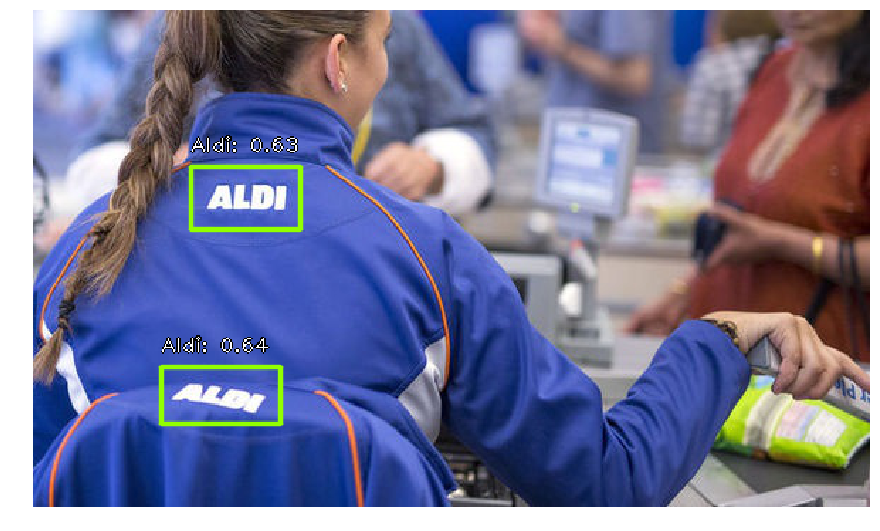

In [89]:
# %%writefile predict.py
# show images inline
%matplotlib inline

# automatically reload modules when they have changed
%load_ext autoreload
%autoreload 2

# import the necessary packages
from keras_retinanet.utils.image import preprocess_image
from keras_retinanet.utils.image import read_image_bgr
from keras_retinanet.utils.image import resize_image
from keras_retinanet import models
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color
import numpy as np
import argparse
import cv2
# import miscellaneous modules
import matplotlib.pyplot as plt
import os
import numpy as np
import time

# REQD Inputs
# The --model switch controls the path to our serialized RetinaNet model. 
# We need to the supply the --labels switch, the path to our CSV labels file, 
# in order to obtain the human readable label for a detection. We also need the 
# path to the input --image that we are applying object detection to. Finally, 
# we can optionally supply --confidence, the minimum probability required 
# for a detection to be marked as such— this value can be used to filter out weak detections.
args = {"labels": "logos/retinanet_classes.csv", 
        "model":"logos/snapshots/deploymentModel_resnet50_csv_49.h5", 
        "confidence":0.5, 
        "image":"logos/images/786414.jpg"}

# load the class label mappings (class to ID mapping)
# loads the contents of our --labels CSV file and then builds a dictionary to
# map the unique integer ID of the prediction (the key) to the human readable class label (the value).
LABELS = open(args["labels"]).read().strip().split("\n")
LABELS = {int(L.split(",")[1]): L.split(",")[0] for L in LABELS}

# load the serialized RetinaNet model from disk  
model = models.load_model(args["model"], backbone_name="resnet50")

# load the input image (in BGR order), clone it, and preprocess it
image = read_image_bgr(args["image"])

# copy to draw on
draw = image.copy()
draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

output = image.copy()
image = preprocess_image(image)


#resize the image to ensure it has a maximum dimension of 1,333px and a minimum dimension of
# 800px. You should refer to the RetinaNet GitHub repo [1] for how this scaling takes place. Also
#note how the scale is returned to us so we can use it to rescale our bounding boxes to the original
#image dimensions in the next code block.
(image, scale) = resize_image(image) #store the scale factor so we can rescale the bboxes after predictio
image = np.expand_dims(image, axis=0)

# detect objects in the input image and correct for the image scale
# predict_on_batch returns: 
# 1. boxes: The set of bounding boxes returned by RetinaNet.
# 2. scores: The corresponding probability of the label for each bounding box.
# 3. labels: The predicted labels for each bounding box.
(boxes, scores, labels) = model.predict_on_batch(image)

# We divide the boxes coordinates by the scale to rescale them to the dimensions of our original
# input image (versus the dimensions of the image after applying preprocess_image).
boxes /= scale
        
# loop over the detections bounding boxes + associated class labels 
# and draw them on our image
for (box, score, label) in zip(boxes[0], scores[0], labels[0]):
    # filter out weak detections
    if score < args["confidence"]:
        continue

    # convert the bounding box coordinates from floats to integers
    box = box.astype("int")
    color = label_color(label)
    # build the label and draw the label + bounding box on the output
    # image
    label = "{}: {:.2f}".format(LABELS[label], score)
    print(f"{label}")
    cv2.rectangle(output, (box[0], box[1]), (box[2], box[3]),
        (0, 255, 0), 2)
    cv2.putText(output, label, (box[0], box[1] - 10),
        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    draw_box(draw, box, color=color)
    draw_caption(draw, box, label)
 

# show the output image
#cv2.imshow("Output", output)
#cv2.waitKey(0)
plt.figure(figsize=(15, 15))
plt.axis('off')
plt.imshow(draw)
plt.show()

### Logo detector  can do well even when the logo is rotated or skewed
A sample of our logo detection results using Keras RetinaNet. Notice how our network
can both correctly detect and label the logos in images, even when the logo is rotated or skewed.

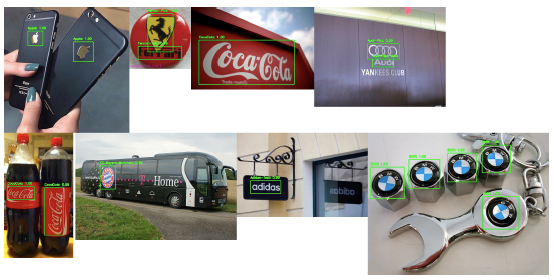

Unlike traditional Haar cascades or HOG + Linear SVM detectors (state of the art until 2012 approximately), our deep learning-based object
detectors are not limited by fixed aspect ratios or rotations. Instead, CNNs are naturally able to
learn features that activate when the logos appear in a rotated or skewed manner. Provided you
have enough labeled data, deep learning-based object detection will likely outperform traditional
object detectors.

### Detect logos for a batch of images

In [ ]:
%%writefile predict_batch.py
# USAGE
# python predict_batch.py --model output.h5 --labels logos/retinanet_classes.csv
#    --input logos/images --output output

# import the necessary packages
from keras_retinanet.utils.image import preprocess_image
from keras_retinanet.utils.image import read_image_bgr
from keras_retinanet.utils.image import resize_image
from keras_retinanet import models
from imutils import paths
import numpy as np
import argparse
import cv2
import os

# construct the argument parse and parse the arguments
ap = argparse.ArgumentParser()
ap.add_argument("-m", "--model", required=True,
    help="path to pre-trained model")
ap.add_argument("-l", "--labels", required=True,
    help="path to class labels")
ap.add_argument("-i", "--input", required=True,
    help="path to directory containing input images")
ap.add_argument("-o", "--output", required=True,
    help="path to directory to store output images")
ap.add_argument("-c", "--confidence", type=float, default=0.5,
    help="minimum probability to filter weak detections")
args = vars(ap.parse_args())

# TODO:
# Allow option for --input to be a .txt file OR a directory. Check if
# file, and if so, presume keras-retinanet set of images + labels

# load the class label mappings
LABELS = open(args["labels"]).read().strip().split("\n")
LABELS = {int(L.split(",")[1]): L.split(",")[0] for L in LABELS}

# load the model from disk and grab all input image paths
model = models.load_model(args["model"], backbone_name="resnet50")
imagePaths = list(paths.list_images(args["input"]))

# loop over the input image paths
for (i, imagePath) in enumerate(imagePaths):
    # load the input image (in BGR order), clone it, and preprocess it
    print("[INFO] predicting on image {} of {}".format(i + 1,
        len(imagePaths)))

    # load the input image (in BGR order), clone it, and preprocess it
    image = read_image_bgr(imagePath)
    output = image.copy()
    image = preprocess_image(image)
    (image, scale) = resize_image(image)
    image = np.expand_dims(image, axis=0)

    # detect objects in the input image and correct for the image scale
    (boxes, scores, labels) = model.predict_on_batch(image)
    boxes /= scale

    # loop over the detections
    for (box, score, label) in zip(boxes[0], scores[0], labels[0]):
        # filter out weak detections
        if score < args["confidence"]:
            continue

        # convert the bounding box coordinates from floats to integers
        box = box.astype("int")

        # build the label and draw the label + bounding box on the output
        # image
        label = "{}: {:.2f}".format(LABELS[label], score)
        cv2.rectangle(output, (box[0], box[1]), (box[2], box[3]),
            (0, 255, 0), 2)
        cv2.putText(output, label, (box[0], box[1] - 10),
            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # parse the filename from the input image path, construct the
    # path to the output image, and write the image to disk
    filename = imagePath.split(os.path.sep)[-1]
    outputPath = os.path.sep.join([args["output"], filename])
    cv2.imwrite(outputPath, output)


# Summary

In this notebook, we introduced object detection and focused on RetinaNet which was developed by Lin et al. in their 2017 paper, Focal Loss for Dense Object Detection. RetinaNet can be considered a cousin to the R-CNN family
(Girshick is listed as an author on the Lin paper) and the SSD family of object detectors.

The notebook then describes  how to use the Keras implementation of RetinaNet to train a 
custom logo detector. The trained logo detector works well on our sample images, but

RetinaNet is more than suitable for use in your own applications; however, be careful when
training your network and be sure to perform a lot of visual validation to ensure your network is
not overfitting.

Note: Trained a Keras model with multiple GPUs does not work well as this time. So PLEASE train with a single GPU!
